![AutodistillMMDetection](http://drive.google.com/uc?id=1cC2auXRxnN2ugydLIbdb7qoe6YS8XbDn)


# Train MMDetection with Autodistill

[Autodistill](https://github.com/autodistill/autodistill) is a tool by [Roboflow](https://roboflow.com/) designed to streamline the process of creating high-quality datasets for machine learning models. This notebook shows how to use [MMDetection](https://github.com/open-mmlab/mmdetection) models as target models for dataset prepared by an Autodistill base model.

## Contents

In this tutorial, we are going to cover:
- Install Required Packages
- Prepare dataset with Autodistill base model

In [1]:
import os
HOME = os.getcwd()
print(HOME)

/content


### Check GPU status and CUDA version

In [2]:
!nvidia-smi

Sat Jun 22 03:38:08 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA L4                      Off | 00000000:00:03.0 Off |                    0 |
| N/A   38C    P8              12W /  72W |      1MiB / 23034MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# 📦Install Required Packages

### 🔥Rollback PyTorch Version

For a quick installation of MMCV, we roll back the PyTorch version to 2.1.0. You need to install MMCV version 2.1.0 since MMDetection requires a version lower than 2.2.0. However, the prebuilt installation of MMCV 2.1.0 only supports PyTorch version 2.1.x (see the MMCV [documentation](https://mmcv.readthedocs.io/en/latest/get_started/installation.html#:~:text=Select%20the%20appropriate,torch2.1/index.html)).

In [3]:
!pip install -q torch==2.1.0 torchvision==0.16.0 torchaudio==2.1.0 torchtext==0.16 --index-url https://download.pytorch.org/whl/cu121

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 GB 988.6 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 92.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 86.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 90.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.2/89.2 MB 18.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 105.0 MB/s eta 0:00:00


### Install MMEngine and MMCV.
⚠️ MMCV versions higher than 2.1.0 may not be compatible with recent MMDetection versions (as of Jun 2024).

In [4]:
!pip install -q mmengine>=0.7.0
!pip install -q mmcv==2.1.0 -f https://download.openmmlab.com/mmcv/dist/cu121/torch2.1/index.html

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.1/94.1 MB 17.5 MB/s eta 0:00:00


### Install MMDetection from source

We could install the prepackaged version, but we choose to install from the original repository for easier configuration modifications and checkpoint downloads.

In [5]:
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

Cloning into 'mmdetection'...
remote: Enumerating objects: 38019, done.
remote: Total 38019 (delta 0), reused 0 (delta 0), pack-reused 38019
Receiving objects: 100% (38019/38019), 63.18 MiB | 10.33 MiB/s, done.
Resolving deltas: 100% (26232/26232), done.
/content/mmdetection


In [6]:
!pip install --quiet -e .

  Preparing metadata (setup.py) ... done


In [7]:
%cd ..

/content


### 🧪 Install Autodistill

In [8]:
!pip install -q autodistill autodistill-grounded-sam roboflow supervision==0.9.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.4/45.4 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.1/93.1 kB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 21.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 85.4 MB/s eta 0:00:00


# 💻 Prepare Dataset with Autodistill Base Model

To prepare a dataset using the Autodistill repository, please follow the [official tutorial](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/how-to-auto-train-yolov8-model-with-autodistill.ipynb). Be sure to check the first three sections: *Before You Start*, *Image Dataset Preparation*, and *Autolabel Dataset*.

💡💡 This notebook runs the same code from the [Autodistill tutorial](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/how-to-auto-train-yolov8-model-with-autodistill.ipynb) to prepare the dataset. If you don't want to run these sections, you can skip to [MMDetection Training](https://colab.research.google.com/drive/1YNyuyXYqgJoCBbTr_kULl8lDb8ZsIYLA#scrollTo=sKuIfXmgUBtM&line=1&uniqifier=1). 💡💡

### 🖼️ Image dataset preperation

In [9]:
!mkdir {HOME}/images

### Download raw videos

In [10]:
!mkdir {HOME}/videos
%cd {HOME}/videos

# download zip file containing videos
!wget https://media.roboflow.com/milk.zip

# unzip videos
!unzip milk.zip

/content/videos
--2024-06-22 03:40:34--  https://media.roboflow.com/milk.zip
Resolving media.roboflow.com (media.roboflow.com)... 34.110.133.209
Connecting to media.roboflow.com (media.roboflow.com)|34.110.133.209|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1192719976 (1.1G) [application/zip]
Saving to: ‘milk.zip’

milk.zip            100%[===================>]   1.11G  17.8MB/s    in 68s     

2024-06-22 03:41:43 (16.8 MB/s) - ‘milk.zip’ saved [1192719976/1192719976]

Archive:  milk.zip
  inflating: milk-video-1.mov        
  inflating: milk-video-2.mov        
  inflating: milk-video-3.mov        
  inflating: milk-video-4.mov        
  inflating: milk-video-5.mov        
  inflating: milk-video-6.mov        
  inflating: milk-video-7.mov        
  inflating: milk-video-8.mov        


### Convert videos into images

In [11]:
VIDEO_DIR_PATH = f"{HOME}/videos"
IMAGE_DIR_PATH = f"{HOME}/images"
FRAME_STRIDE = 10

In [12]:
import supervision as sv
from tqdm.notebook import tqdm

video_paths = sv.list_files_with_extensions(
    directory=VIDEO_DIR_PATH,
    extensions=["mov", "mp4"])

TEST_VIDEO_PATHS, TRAIN_VIDEO_PATHS = video_paths[:2], video_paths[2:]

for video_path in tqdm(TRAIN_VIDEO_PATHS):
    video_name = video_path.stem
    image_name_pattern = video_name + "-{:05d}.png"
    with sv.ImageSink(target_dir_path=IMAGE_DIR_PATH, image_name_pattern=image_name_pattern) as sink:
        for image in sv.get_video_frames_generator(source_path=str(video_path), stride=FRAME_STRIDE):
            sink.save_image(image=image)

  0%|          | 0/6 [00:00<?, ?it/s]

### Display image sample

In [13]:
import supervision as sv

image_paths = sv.list_files_with_extensions(
    directory=IMAGE_DIR_PATH,
    extensions=["png", "jpg", "jpg"])

print('image count:', len(image_paths))

image count: 153


In [14]:
IMAGE_DIR_PATH = f"{HOME}/images"
SAMPLE_SIZE = 16
SAMPLE_GRID_SIZE = (4, 4)
SAMPLE_PLOT_SIZE = (16, 16)

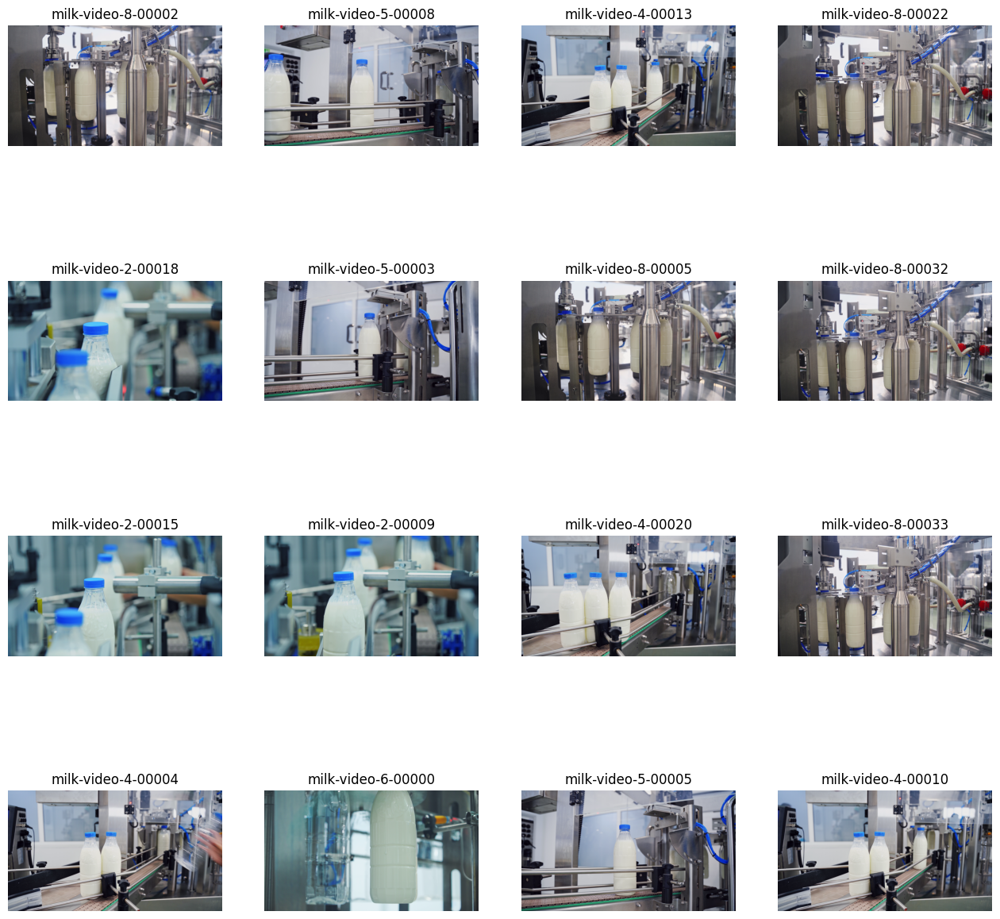

In [15]:
import cv2
import supervision as sv

titles = [
    image_path.stem
    for image_path
    in image_paths[:SAMPLE_SIZE]]
images = [
    cv2.imread(str(image_path))
    for image_path
    in image_paths[:SAMPLE_SIZE]]

sv.plot_images_grid(images=images, titles=titles, grid_size=SAMPLE_GRID_SIZE, size=SAMPLE_PLOT_SIZE)

### 🏷️ Autolabel dataset

#### Define ontology

**Ontology** - an Ontology defines how your Base Model is prompted, what your Dataset will describe, and what your Target Model will predict.

In [16]:
from autodistill.detection import CaptionOntology

ontology=CaptionOntology({
    "milk bottle": "bottle",
    "blue cap": "cap"
})

### Initiate base model and autolabel

**Base Model** - A Base Model is a large foundation model that knows a lot about a lot. We use a Base Model (along with unlabeled input data and an Ontology) to create a Dataset.

In [17]:
DATASET_DIR_PATH = f"{HOME}/dataset"

**NOTE:** Base Models are slow...

In [18]:
from autodistill_grounded_sam import GroundedSAM

base_model = GroundedSAM(ontology=ontology)
dataset = base_model.label(
    input_folder=IMAGE_DIR_PATH,
    extension=".png",
    output_folder=DATASET_DIR_PATH)

trying to load grounding dino directly
downloading dino model weights


torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)


final text_encoder_type: bert-base-uncased



The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

`resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.


config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Labeling /content/images/milk-video-8-00002.png:   0%|          | 0/153 [00:00<?, ?it/s]The `device` argument is deprecated and will be removed in v5 of Transformers.
torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
None of the inputs have requires_grad=True. Gradients will be None
The `device` argument is deprecated and will be removed in v5 of Transformers.
torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences betwe

Labeled dataset created - ready for distillation.


### Display dataset sample

**Dataset** - a Dataset is a set of auto-labeled data that can be used to train a Target Model. It is the output generated by a Base Model.

In [19]:
ANNOTATIONS_DIRECTORY_PATH = f"{HOME}/dataset/train/labels"
IMAGES_DIRECTORY_PATH = f"{HOME}/dataset/train/images"
DATA_YAML_PATH = f"{HOME}/dataset/data.yaml"

In [20]:
import supervision as sv

dataset = sv.DetectionDataset.from_yolo(
    images_directory_path=IMAGES_DIRECTORY_PATH,
    annotations_directory_path=ANNOTATIONS_DIRECTORY_PATH,
    data_yaml_path=DATA_YAML_PATH)

len(dataset)

122

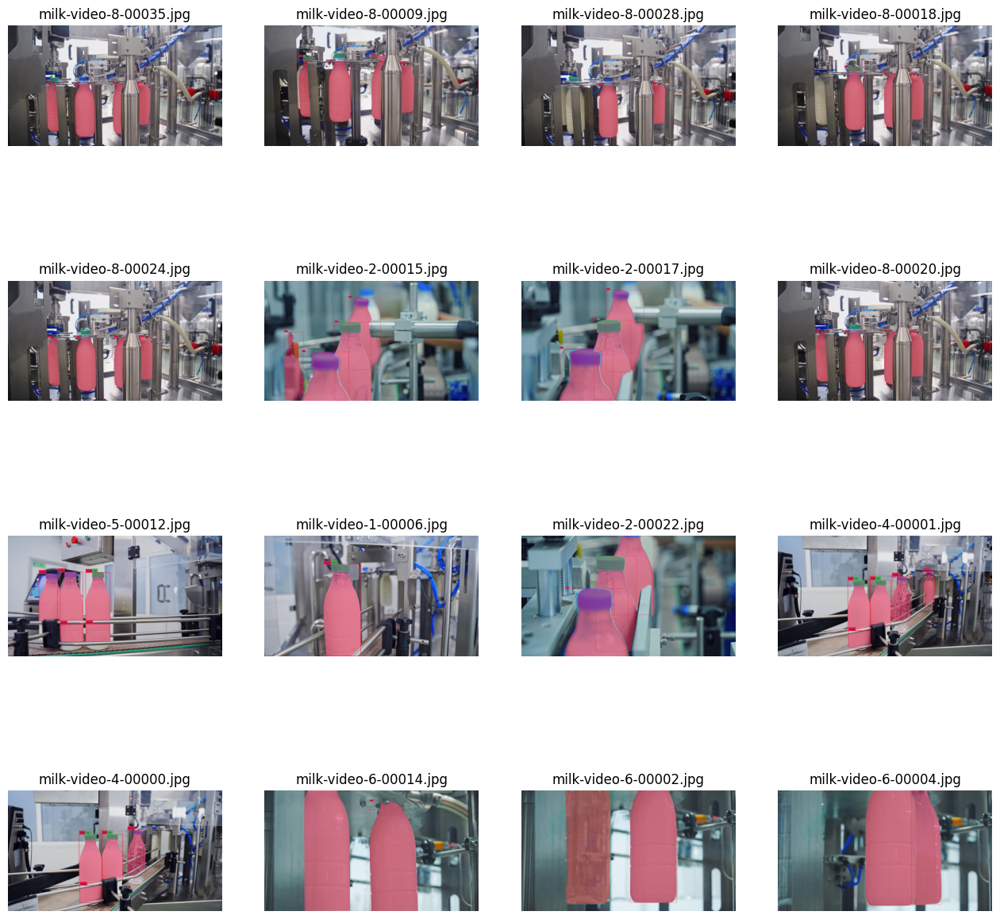

In [21]:
import supervision as sv

image_names = list(dataset.images.keys())[:SAMPLE_SIZE]

mask_annotator = sv.MaskAnnotator()
box_annotator = sv.BoxAnnotator()

images = []
for image_name in image_names:
    image = dataset.images[image_name]
    annotations = dataset.annotations[image_name]
    labels = [
        dataset.classes[class_id]
        for class_id
        in annotations.class_id]
    annotates_image = mask_annotator.annotate(
        scene=image.copy(),
        detections=annotations)
    annotates_image = box_annotator.annotate(
        scene=annotates_image,
        detections=annotations,
        labels=labels)
    images.append(annotates_image)

sv.plot_images_grid(
    images=images,
    titles=image_names,
    grid_size=SAMPLE_GRID_SIZE,
    size=SAMPLE_PLOT_SIZE)


# 👨‍🏫 Train MMDetection Model

In [22]:
%cd {HOME}/mmdetection

/content/mmdetection


### Add YOLO Dataset Support to MMDetection

Autodistill's default output format is the YOLO dataset. However, it appears that MMDetection currently does not support this format. Therefore, we have created a custom YOLO dataset format for training with MMDetection's pretrained models.

The folder structure of the dataset prepared by Autodistill is organized as follows:
```
train
├── images
│   ├── train_img1.jpg
│   ├── ...
├── labels
│   ├── train_img1.txt
│   ├── ...
valid
├── images
│   ├── valid_img1.jpg
│   ├── ...
├── labels
│   ├── valid_img1.txt
│   ├── ...
data.yaml
```

In YOLO format, each coordinate is represented as a ratio of the width and height of the image. Each label file follows this format for every line:

```markdown
<object-class> <x1> <y1> <x2> <y2> ... <xn> <yn>
```


In [23]:
from glob import glob
import os.path as osp

from mmdet.datasets.base_det_dataset import BaseDetDataset
from mmdet.registry import DATASETS
import mmcv

@DATASETS.register_module()
class YOLODataset(BaseDetDataset):
    METAINFO = {
        'classes': (),
        'palette': []
    }

    def __init__(self,
                 img_subdir: str = 'images',
                 ann_subdir: str = 'labels',
                 **kwargs) -> None:
        self.img_subdir = img_subdir
        self.ann_subdir = ann_subdir
        super().__init__(**kwargs)


    def load_data_list(self) -> None:
        ann_subdir = osp.join(self.data_root, self.ann_subdir)
        data_infos = []

        ann_list = glob(osp.join(ann_subdir, '*.txt'))

        for i, ann_file in enumerate(ann_list):
            with open(ann_file, 'r') as f:
                ann_txt = f.readlines()

            img_file = osp.join(self.data_root, self.img_subdir, ann_file.split('/')[-1].replace('txt', 'jpg'))
            img_shape = mmcv.imread(img_file).shape
            width = img_shape[1]
            height = img_shape[0]

            instances = []
            for line in ann_txt:
                line = list(map(float, line.strip().split(' ')))
                instance = {}

                x_coords = [line[j] * width for j in range(1, len(line), 2)]
                y_coords = [line[j + 1] * height for j in range(1, len(line), 2)]

                x_min, y_min = min(x_coords), min(y_coords)
                x_max, y_max = max(x_coords), max(y_coords)

                bbox = [int(x_min), int(y_min), int(x_max), int(y_max)]
                mask = [[int(coord) for pair in zip(x_coords, y_coords) for coord in pair]]

                instance['bbox'] = bbox
                instance['bbox_label'] = int(line[0])
                instance['ignore_flag'] = 0
                instance['mask'] = mask
                instances.append(instance)

            data_infos.append({
                'img_path': img_file,
                'img_id': i,
                'width': width,
                'height': height,
                'instances': instances
            })

        return data_infos

In [24]:
train_dataset = YOLODataset(
    data_root='/content/dataset/train/'
)

data_info = train_dataset.load_data_list()

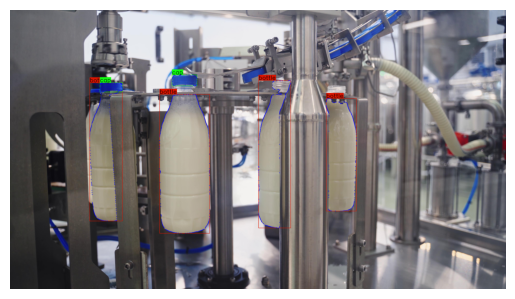

In [25]:
import matplotlib.pyplot as plt
import cv2

data = data_info[1]
img = cv2.imread(data['img_path'])
classes = ['bottle', 'cap']
palette = [(0, 20, 220), (15, 255, 15)]

for instance in data['instances']:
    # Draw bounding box
    x1, y1, x2, y2 = instance['bbox']
    x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

    color = palette[instance['bbox_label']]
    img = cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)

    class_name = classes[instance['bbox_label']]
    (text_width, text_height), _ = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 1.5, 2)
    img = cv2.rectangle(img, (x1, y1 - text_height - 10), (x1 + text_width, y1), color, -1)
    img = cv2.putText(img, class_name, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 0, 0), 2)

    # Draw mask
    mask = instance['mask'][0]
    for i in range(0, len(mask), 2):
        x, y = int(mask[i]), int(mask[i + 1])
        img = cv2.circle(img, (x, y), 2, (255, 0, 0), -1)

plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')  # Optional: Hide axis
plt.show()

### Choose pretrained model you want to fine-tune

Go to [configs](https://github.com/open-mmlab/mmdetection/tree/main/configs) folder in MMDetection repository and download any pretrained model you want. Even though our dataset follows the format of YOLO dataset, it should work with other models such as [Cascade R-CNN](https://arxiv.org/abs/1712.00726)

In [26]:
from mmengine.runner import set_random_seed

from mmengine import Config
cfg = Config.fromfile('./configs/cascade_rcnn/cascade-mask-rcnn_r50_fpn_1x_coco.py')

In [27]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [28]:
!wget -P ./checkpoints https://download.openmmlab.com/mmdetection/v2.0/cascade_rcnn/cascade_rcnn_r50_fpn_1x_coco/cascade_rcnn_r50_fpn_1x_coco_20200316-3dc56deb.pth

--2024-06-22 04:02:09--  https://download.openmmlab.com/mmdetection/v2.0/cascade_rcnn/cascade_rcnn_r50_fpn_1x_coco/cascade_rcnn_r50_fpn_1x_coco_20200316-3dc56deb.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 163.181.199.241, 163.181.199.242, 163.181.199.246, ...
Connecting to download.openmmlab.com (download.openmmlab.com)|163.181.199.241|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 277858723 (265M) [application/octet-stream]
Saving to: ‘./checkpoints/cascade_rcnn_r50_fpn_1x_coco_20200316-3dc56deb.pth’

cascade_rcnn_r50_fp 100%[===================>] 264.99M  37.1MB/s    in 7.1s    

2024-06-22 04:02:16 (37.4 MB/s) - ‘./checkpoints/cascade_rcnn_r50_fpn_1x_coco_20200316-3dc56deb.pth’ saved [277858723/277858723]



In [29]:
from pprint import pprint
pprint(cfg.to_dict())

{'auto_scale_lr': {'base_batch_size': 16, 'enable': False},
 'backend_args': None,
 'data_root': 'data/coco/',
 'dataset_type': 'CocoDataset',
 'default_hooks': {'checkpoint': {'interval': 1, 'type': 'CheckpointHook'},
                   'logger': {'interval': 50, 'type': 'LoggerHook'},
                   'param_scheduler': {'type': 'ParamSchedulerHook'},
                   'sampler_seed': {'type': 'DistSamplerSeedHook'},
                   'timer': {'type': 'IterTimerHook'},
                   'visualization': {'type': 'DetVisualizationHook'}},
 'default_scope': 'mmdet',
 'env_cfg': {'cudnn_benchmark': False,
             'dist_cfg': {'backend': 'nccl'},
             'mp_cfg': {'mp_start_method': 'fork', 'opencv_num_threads': 0}},
 'load_from': None,
 'log_level': 'INFO',
 'log_processor': {'by_epoch': True, 'type': 'LogProcessor', 'window_size': 50},
 'model': {'backbone': {'depth': 50,
                        'frozen_stages': 1,
                        'init_cfg': {'checkpoint': 'to

### Examining the Dataloader Configuration

Navigating the MMDetection configuration can be challenging due to the numerous available options. For our purposes, we need to focus on the `train_dataloader`, `val_dataloader`, and `test_dataloader` settings, which are essential for the dataloader pipeline.

In this example, we need to remove the `ann_file` and `data_prefix` options as they are not required. Additionally, we should update `data_root` to point to our directory and set `type` to `YOLODataset`.

In [30]:
pprint(cfg.train_dataloader)

{'batch_sampler': {'type': 'AspectRatioBatchSampler'},
 'batch_size': 2,
 'dataset': {'ann_file': 'annotations/instances_train2017.json',
             'backend_args': None,
             'data_prefix': {'img': 'train2017/'},
             'data_root': 'data/coco/',
             'filter_cfg': {'filter_empty_gt': True, 'min_size': 32},
             'pipeline': [{'backend_args': None, 'type': 'LoadImageFromFile'},
                          {'type': 'LoadAnnotations',
                           'with_bbox': True,
                           'with_mask': True},
                          {'keep_ratio': True,
                           'scale': (1333, 800),
                           'type': 'Resize'},
                          {'prob': 0.5, 'type': 'RandomFlip'},
                          {'type': 'PackDetInputs'}],
             'type': 'CocoDataset'},
 'num_workers': 2,
 'persistent_workers': True,
 'sampler': {'shuffle': True, 'type': 'DefaultSampler'}}


In [31]:
cfg.data_root = '/content/dataset'

cfg.metainfo  = {
    'classes': ('bottle', 'cap'),
    'palette': [
        (220, 20, 60),
        (0, 15, 255)
    ]
}


cfg.dataset_type = 'YOLODataset'

cfg.train_dataloader.dataset.type = cfg.dataset_type
cfg.train_dataloader.dataset.data_root = cfg.data_root + '/train'
cfg.train_dataloader.dataset.metainfo = cfg.metainfo

del cfg.train_dataloader.dataset.ann_file
del cfg.train_dataloader.dataset.data_prefix

cfg.val_dataloader.dataset.type = cfg.dataset_type
cfg.val_dataloader.dataset.data_root = cfg.data_root + '/valid'
cfg.val_dataloader.dataset.metainfo = cfg.metainfo

del cfg.val_dataloader.dataset.ann_file
del cfg.val_dataloader.dataset.data_prefix

cfg.test_dataloader = cfg.val_dataloader

### Examining the Evaluator Configuration

When examining the evaluator configuration, especially those derived from the COCO-style configuration, you may encounter an `ann_file` option. This option is not necessary for our case and should be removed. By deleting the `ann_file`, the evaluator will utilize the ground truth directly from the dataset.

In [32]:
from pprint import pprint

pprint(cfg.val_evaluator)

{'ann_file': 'data/coco/annotations/instances_val2017.json',
 'backend_args': None,
 'format_only': False,
 'metric': ['bbox', 'segm'],
 'type': 'CocoMetric'}


In [33]:
del cfg.val_evaluator.ann_file
del cfg.test_evaluator.ann_file

To pass the annotation for the evaluation processor, we need to add `instance` to the `val_pipeline`.

In [34]:
val_pipeline = []
for c in cfg.val_dataloader.dataset.pipeline:
    if not 'meta_keys' in c:
        val_pipeline.append(c)
    else:
        val_pipeline.append(
           {'meta_keys': ('img_id',
                        'img_path',
                        'ori_shape',
                        'img_shape',
                        'scale_factor',
                          'instances'),
            'type': 'PackDetInputs'}
        )

cfg.val_dataloader.dataset.pipeline = val_pipeline

### Modifying the Number of Classes for Each Branch

✔️ Architecture of Cascade R-CNN
![Cascade R-CNN](http://drive.google.com/uc?id=1SoHYVSMoFAkA9xUjIzhv-2h2UWfjTuSN)

Cascade R-CNN is an extended architecture derived from Faster R-CNN. It features two additional detection branches to enhance accuracy. Moreover, it includes a mask branch for instance segmentation.

In [35]:
cfg.model.roi_head.bbox_head[0].num_classes = 2
cfg.model.roi_head.bbox_head[1].num_classes = 2
cfg.model.roi_head.bbox_head[2].num_classes = 2
cfg.model.roi_head.mask_head.num_classes = 2

In [36]:
cfg.load_from = './checkpoints/cascade_rcnn_r50_fpn_1x_coco_20200316-3dc56deb.pth'
cfg.work_dir = './tutorial_exps'

cfg.train_cfg.val_interval = 3
cfg.default_hooks.checkpoint.interval = 3

cfg.visualizer.vis_backends.append({"type":'TensorboardVisBackend'})

Check the modified configuration before starting the training.

In [37]:
pprint(cfg.to_dict())

{'auto_scale_lr': {'base_batch_size': 16, 'enable': False},
 'backend_args': None,
 'data_root': '/content/dataset',
 'dataset_type': 'YOLODataset',
 'default_hooks': {'checkpoint': {'interval': 3, 'type': 'CheckpointHook'},
                   'logger': {'interval': 50, 'type': 'LoggerHook'},
                   'param_scheduler': {'type': 'ParamSchedulerHook'},
                   'sampler_seed': {'type': 'DistSamplerSeedHook'},
                   'timer': {'type': 'IterTimerHook'},
                   'visualization': {'type': 'DetVisualizationHook'}},
 'default_scope': 'mmdet',
 'env_cfg': {'cudnn_benchmark': False,
             'dist_cfg': {'backend': 'nccl'},
             'mp_cfg': {'mp_start_method': 'fork', 'opencv_num_threads': 0}},
 'load_from': './checkpoints/cascade_rcnn_r50_fpn_1x_coco_20200316-3dc56deb.pth',
 'log_level': 'INFO',
 'log_processor': {'by_epoch': True, 'type': 'LogProcessor', 'window_size': 50},
 'metainfo': {'classes': ('bottle', 'cap'),
              'palette'

In [38]:
from mmengine.runner import Runner

runner = Runner.from_cfg(cfg)
# start training
runner.train()
runner.test()

06/22 04:02:17 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1835254228
    GPU 0: NVIDIA L4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.2, V12.2.140
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.1.0+cu121
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v3.1.1 (Git Hash 64f6bcbcbab628e96f33a62c3e975f8535a7bde4)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX512
  - CUDA Runtime 12.1
  - NVCC architecture flags: -gencode;arch=compute_50,code

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


06/22 04:02:30 - mmengine - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias

Loads checkpoint by local backend from path: ./checkpoints/cascade_rcnn_r50_fpn_1x_coco_20200316-3dc56deb.pth
The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.0.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([3, 1024]).
size mismatch for roi_head.bbox_head.0.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([3]).
size mismatch for roi_head.bbox_head.1.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([3, 1024]).
size mismatch for roi_head.bbox_head.1.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([3]).
size mismatch for r

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


06/22 04:02:58 - mmengine - INFO - Epoch(train)  [1][50/61]  lr: 1.9820e-03  eta: 0:06:22  time: 0.5609  data_time: 0.0337  memory: 8326  loss: 2.0984  loss_rpn_cls: 0.0329  loss_rpn_bbox: 0.0102  s0.loss_cls: 0.4087  s0.acc: 97.5586  s0.loss_bbox: 0.0461  s0.loss_mask: 0.6404  s1.loss_cls: 0.2412  s1.acc: 97.9633  s1.loss_bbox: 0.0508  s1.loss_mask: 0.3397  s2.loss_cls: 0.1276  s2.acc: 96.9886  s2.loss_bbox: 0.0391  s2.loss_mask: 0.1618
06/22 04:03:04 - mmengine - INFO - Exp name: cascade-mask-rcnn_r50_fpn_1x_coco_20240622_040216
06/22 04:03:33 - mmengine - INFO - Epoch(train)  [2][50/61]  lr: 4.4244e-03  eta: 0:05:51  time: 0.5705  data_time: 0.0273  memory: 8329  loss: 0.9297  loss_rpn_cls: 0.0040  loss_rpn_bbox: 0.0095  s0.loss_cls: 0.0769  s0.acc: 97.4609  s0.loss_bbox: 0.0277  s0.loss_mask: 0.4171  s1.loss_cls: 0.0371  s1.acc: 95.6055  s1.loss_bbox: 0.0324  s1.loss_mask: 0.1834  s2.loss_cls: 0.0231  s2.acc: 95.1172  s2.loss_bbox: 0.0292  s2.loss_mask: 0.0893
06/22 04:03:39 - mmen

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than tensor.new_tensor(sourceTensor).


06/22 04:04:28 - mmengine - INFO - Converting ground truth to coco format...
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
06/22 04:04:28 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.04s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.817
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.918
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.918
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.851
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.799
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.873
 Average

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than tensor.new_tensor(sourceTensor).


06/22 04:06:27 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.04s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.846
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.938
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.938
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.841
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.833
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.883
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.883
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.883
 Averag

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than tensor.new_tensor(sourceTensor).


06/22 04:08:23 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.04s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.880
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.935
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.931
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.924
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.836
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.901
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.901
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.901
 Averag

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than tensor.new_tensor(sourceTensor).


06/22 04:10:20 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.04s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.885
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.931
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.926
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.930
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.844
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.905
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.905
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.905
 Averag

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than tensor.new_tensor(sourceTensor).


06/22 04:10:31 - mmengine - INFO - Converting ground truth to coco format...
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
06/22 04:10:31 - mmengine - INFO - Evaluating bbox...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.04s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.885
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.931
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.926
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.930
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.844
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.905
 Average

{'coco/bbox_mAP': 0.885,
 'coco/bbox_mAP_50': 0.931,
 'coco/bbox_mAP_75': 0.926,
 'coco/bbox_mAP_s': -1.0,
 'coco/bbox_mAP_m': 0.93,
 'coco/bbox_mAP_l': 0.844,
 'coco/segm_mAP': 0.832,
 'coco/segm_mAP_50': 0.917,
 'coco/segm_mAP_75': 0.899,
 'coco/segm_mAP_s': -1.0,
 'coco/segm_mAP_m': 0.897,
 'coco/segm_mAP_l': 0.797}

In [39]:
!pip install tensorboard  -i https://mirrors.ustc.edu.cn/pypi/web/simple

Looking in indexes: https://mirrors.ustc.edu.cn/pypi/web/simple


In [40]:
%load_ext tensorboard

In [41]:
%tensorboard --logdir tutorial_exps/

<IPython.core.display.Javascript object>

In [42]:
import mmcv
from mmdet.apis import init_detector, inference_detector
img = mmcv.imread('/content/dataset/valid/images/milk-video-1-00000.jpg',channel_order='rgb')
checkpoint_file = 'tutorial_exps/epoch_12.pth'
model = init_detector(cfg, checkpoint_file, device='cuda')
new_result = inference_detector(model, img)

Loads checkpoint by local backend from path: tutorial_exps/epoch_12.pth


To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than tensor.new_tensor(sourceTensor).


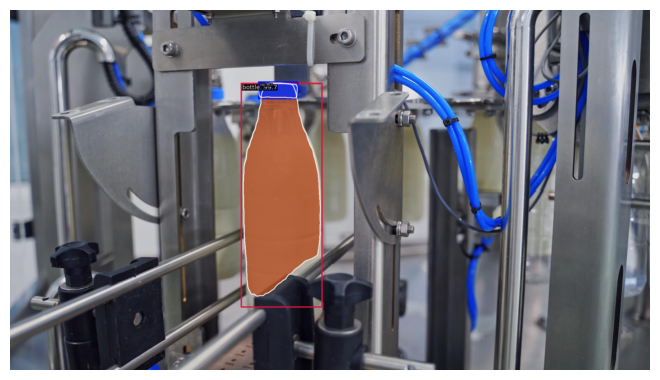

In [43]:
from mmengine.visualization import Visualizer

visualizer_now = Visualizer.get_current_instance()
visualizer_now.dataset_meta = model.dataset_meta
visualizer_now.add_datasample(
    'new_result',
    img,
    data_sample=new_result,
    draw_gt=False,
    wait_time=0,
    out_file=None,
    pred_score_thr=0.5
)
visualizer_now.show()